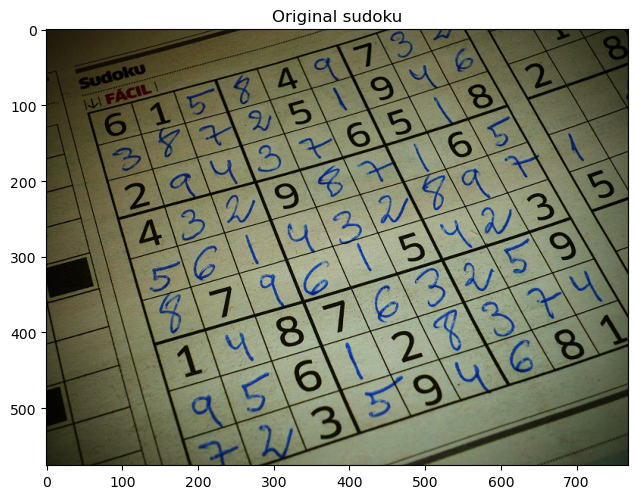

In [23]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Define our imshow function 
def imshow(title = "Image", image = None, size = 10):
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

sudoku = cv2.imread('/Users/apple/Desktop/Projects/Computer Vision/images/soduku.jpg')
imshow('Original sudoku', sudoku)

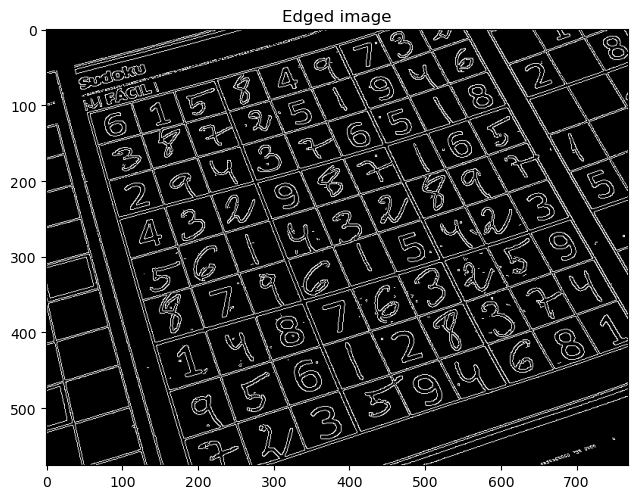

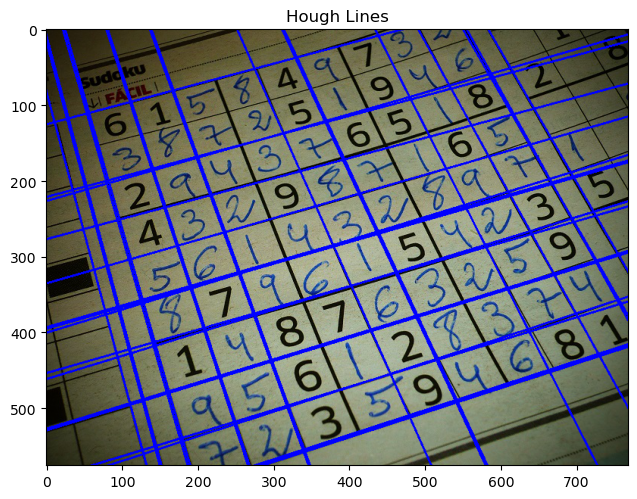

In [24]:
gray = cv2.cvtColor(sudoku, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 100, 170, apertureSize = 3)
imshow('Edged image', edges)

lines = cv2.HoughLines(edges, 1, np.pi/180, 240)

for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv2.line(sudoku, (x1, y1), (x2, y2), (255, 0, 0), 2)

imshow('Hough Lines', sudoku)

### Counting circles, ellipses, and finding a video



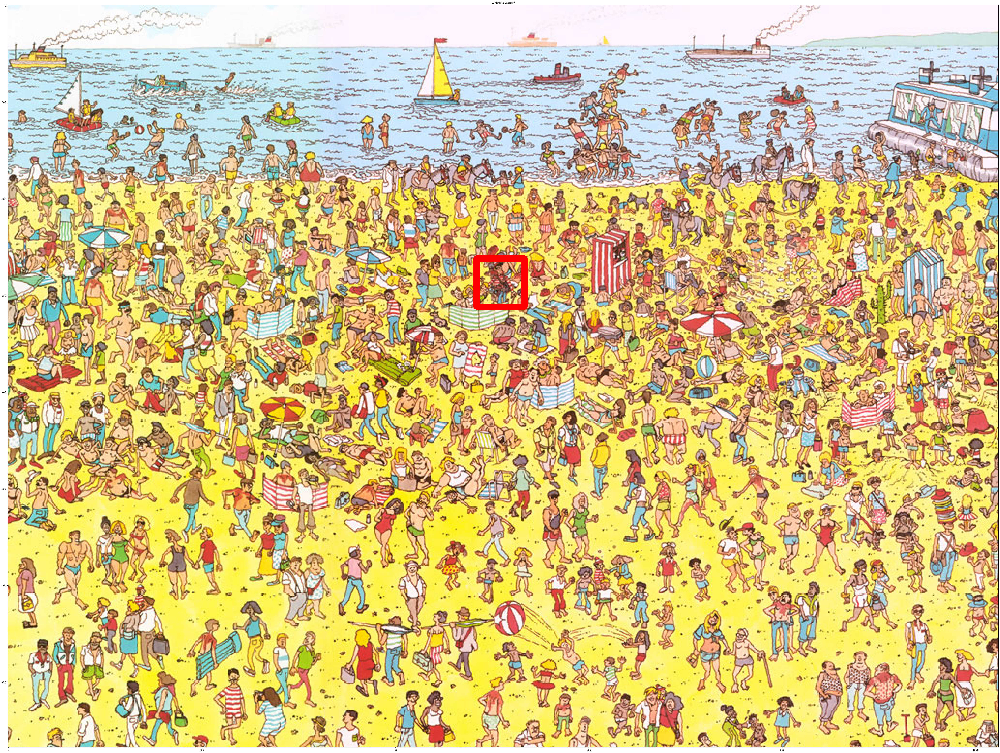

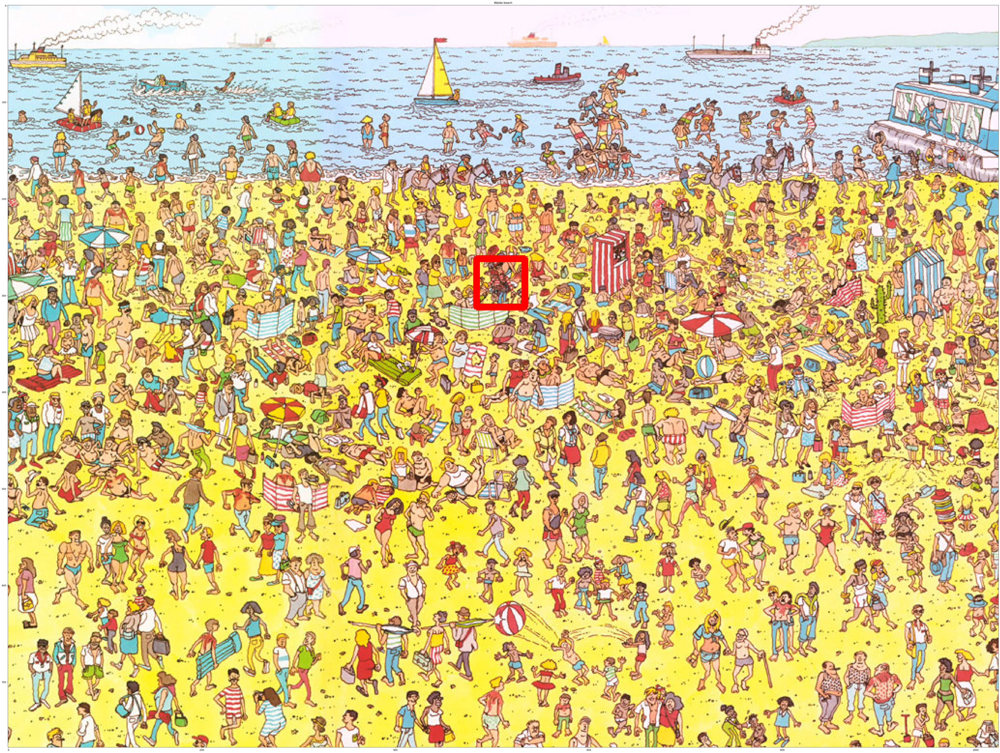

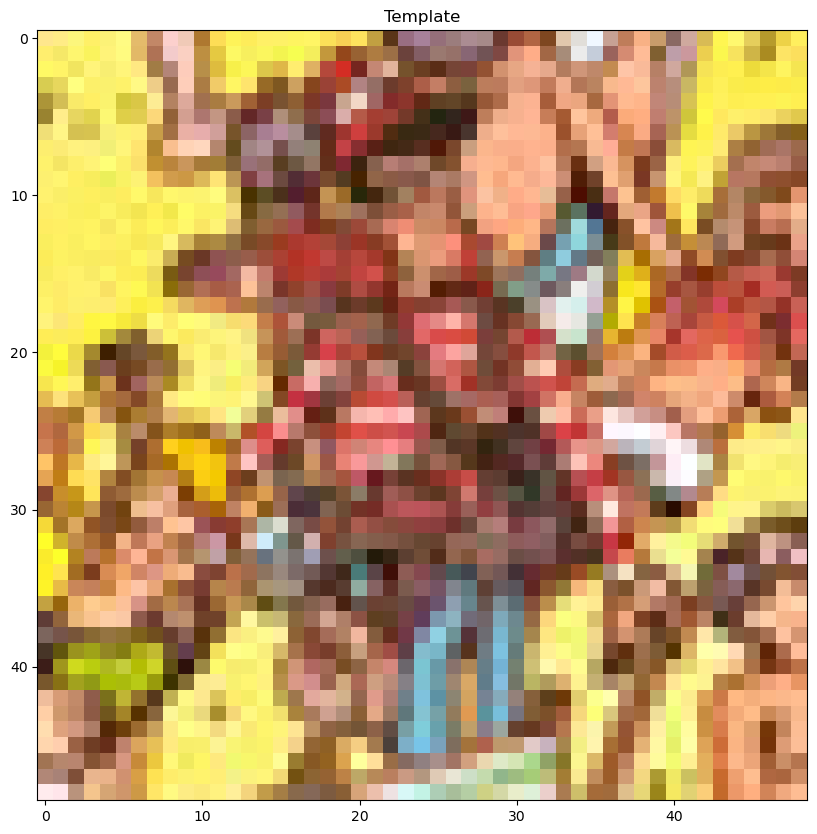

In [25]:
template = cv2.imread('/Users/apple/Desktop/Projects/Computer Vision/images/waldo.jpg')
img = cv2.imread('/Users/apple/Desktop/Projects/Computer Vision/images/WaldoBeach.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
temp_gray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

result = cv2.matchTemplate(gray, temp_gray, cv2.TM_CCOEFF)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

top_left = max_loc
bottom_right = (top_left[0] + 50, top_left[1] + 50)
cv2.rectangle(img, top_left, bottom_right, (0,0,255), 5)

imshow('Where is Waldo?', img, 100)
imshow('Waldo beach', img, 100)
imshow('Template', template)

### Finding Corners

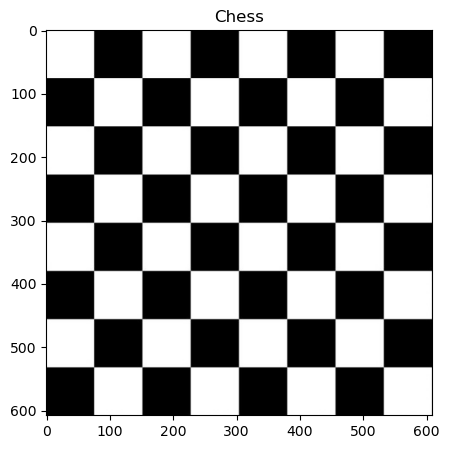

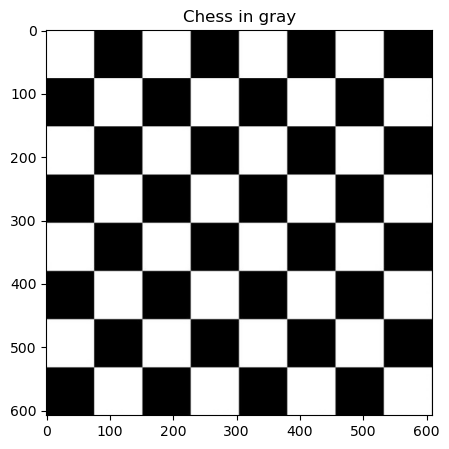

In [26]:
chess = cv2.imread('/Users/apple/Desktop/Projects/Computer Vision/images/chess.jpg')
gray = cv2.imread('/Users/apple/Desktop/Projects/Computer Vision/images/chess.jpg', 0)
imshow('Chess', chess, 5)
imshow('Chess in gray', gray, 5)

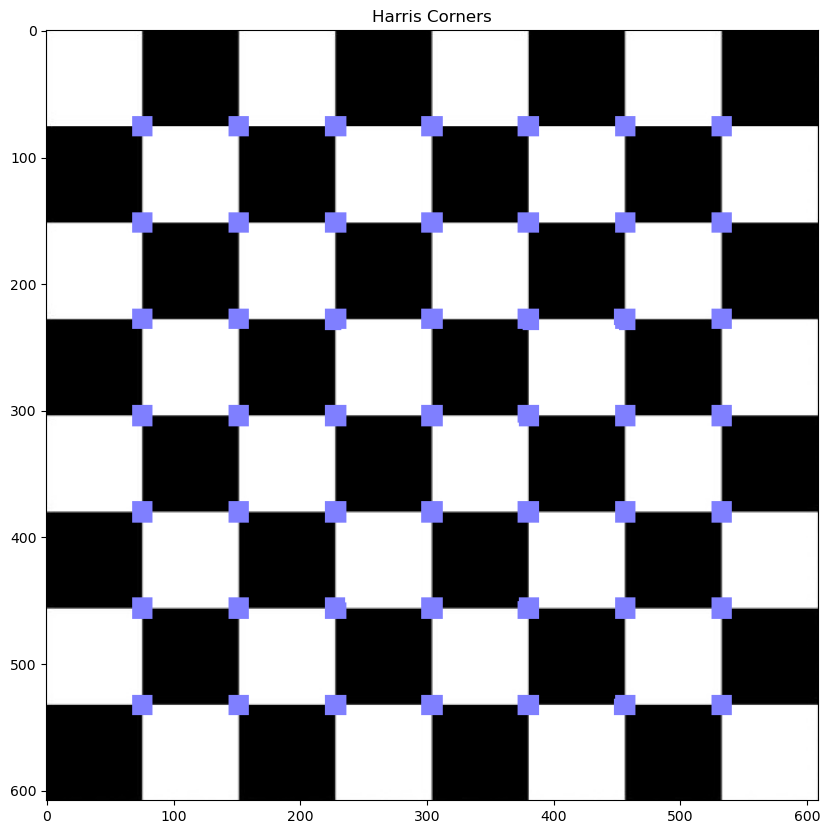

In [27]:
gray = np.float32(gray) 
harris_corners = cv2.cornerHarris(gray, 3, 3, 0.05)

#We use dilation of the corner points to enlarge them\
kernel = np.ones((7,7),np.uint8)
harris_corners = cv2.dilate(harris_corners, kernel, iterations = 2)

# Threshold for an optimal value, it may vary depending on the image.
chess[harris_corners > 0.025 * harris_corners.max() ] = [255, 127, 127]

imshow('Harris Corners', chess) # Harris algorithm analyzes 4 sides of edges, it is pretty usefull algorithm when we want to find corners or edges perfectly, coz edges algorithm checks only vertically or diagonally, so it might get the same

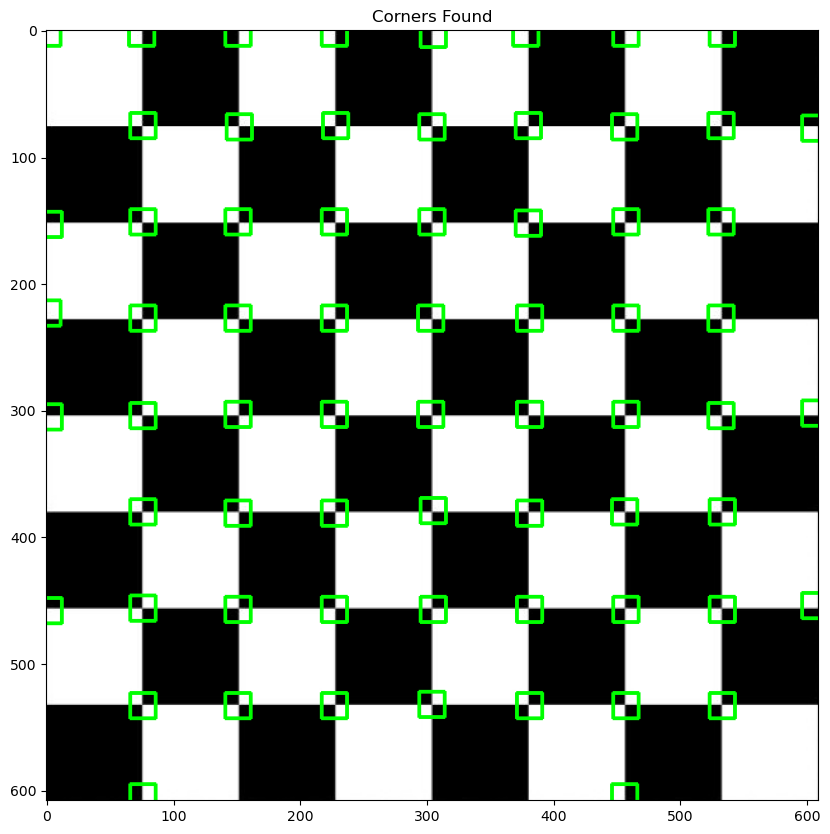

In [37]:
chess = cv2.imread('/Users/apple/Desktop/Projects/Computer Vision/images/chess.jpg')
gray = cv2.cvtColor(chess,cv2.COLOR_BGR2GRAY)

# We specific the top 50 corners
corners = cv2.goodFeaturesToTrack(gray, 150, 0.0005, 10)

for corner in corners:
    x, y = corner[0]
    x = int(x)
    y = int(y)
    cv2.rectangle(chess,(x-10,y-10),(x+10,y+10),(0,255,0), 2)
    
imshow("Corners Found", chess)